## Setup

The full project is available at:
- https://github.com/379f523e295b/ee6222-assignment1-fc9a

(NOTE: The full project structure is required to run this notebook)

### Packages

Uncomment below to install.

Utitilties

In [46]:
#%pip install --quiet jupyter-spaces
#%pip install --quiet scrapbook scrapbook-ext==0.0.0a2

Frameworks

In [47]:
#%pip install --quiet matplotlib 
#%pip install --quiet keras-cv
#%pip install --quiet tensorflow tensorflow-datasets
#%pip install --quiet pydot

Dataset (EE6222 HAR Video)

... requires `./datasets` present

In [48]:
%pip install --quiet --editable ./datasets

Note: you may need to restart the kernel to use updated packages.


### Extensions
... for Jupyter Notebooks

In [49]:
%load_ext jupyter_spaces

The jupyter_spaces extension is already loaded. To reload it, use:
  %reload_ext jupyter_spaces


### Imports and Utilities

`IPython`: ... for HTML rendering

In [50]:
import IPython as ipy

`scrapbook`: ... for data storage inside notebooks

In [51]:
import scrapbook
import scrapbook_ext.encoders.pickle

scrapbook_ext.encoders.pickle.load()

`matplotlib`: ... for data visualization

In [52]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams.update({
    # text
    #'text.usetex': True,
    'font.family': 'sans-serif',
    # figure
    'figure.constrained_layout.use': True,
    # pgf
    'pgf.texsystem': 'lualatex',
    'pgf.rcfonts': False,
    'pgf.preamble': r'\renewcommand\sffamily{}'
})

`tensorflow`: ... for data processing and learning

In [53]:
import tensorflow as tf
import tensorflow_datasets as tfds

from tensorflow import keras

# enable mixed precision for performance
keras.mixed_precision.set_global_policy('mixed_float16')

`tensorflow_datasets_ee6222har`: ... `tensorflow` dataset

In [54]:
import tensorflow_datasets_ee6222har.ee6222har as tfds_ee6222har

ds_builder = tfds_ee6222har.builder.Builder()
ds_builder.download_and_prepare()

In [55]:
ds = ds_builder.as_dataset(as_supervised=False)

Miscellaneous

In [56]:
take_one = lambda x: next(iter(x))

## EDA

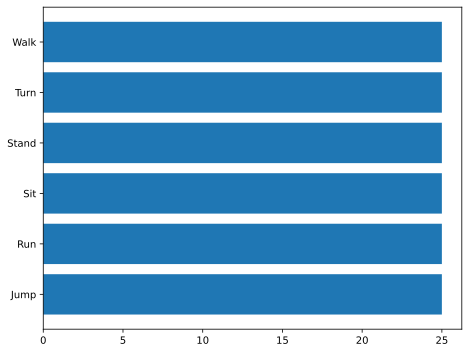

In [57]:
%%space demo:eda

import numpy as np

targets, freqs_target = np.unique(
    np.asarray(list(ds['train'].map(lambda x: x['label']))),
    return_counts=True,
)

fig, ax = plt.subplots()
ax.barh(
    [
        ds_builder.info.features['label'].mapping[target]
        for target in targets
    ],
    freqs_target
)
fig.show()

## Frame Sampling

In [58]:
import abc
import typing


class BaseSampling(keras.layers.Layer, abc.ABC):
    # TODO NOTE index sampling
    # TODO NOTE range [minval, maxval)
    def _range_sampler(
        self, 
        range_n: typing.Tuple[int, int],
        n_samples: int, 
    ) -> typing.Sequence[tf.int32]:
        raise NotImplementedError

    # TODO NOTE index sampling
    # TODO NOTE range [minval, maxval)
    def _sample_range(
        self, 
        range_n: typing.Tuple[int, int],
        n_samples: int | float, 
    ) -> typing.Sequence[tf.int32]:
        # TODO
        minval, maxval = range_n
        l_range = maxval - minval + 1
        return self._range_sampler(
            range_n=range_n,
            n_samples=(
                tf.cast(
                    self.n_samples * tf.cast(l_range, tf.float32), 
                    tf.int32,
                ) 
                if isinstance(n_samples, float) else
                (n_samples)
            ),
        )

    def _sample_indices(self, input):
        axis = self.axis
        n = tf.shape(input)[axis]
        return self._sample_range(
            range_n=(0, n),
            n_samples=self.n_samples,
        )

    def _gather_samples(self, input, indices):
        return tf.gather(
            input,
            indices=indices,
            axis=self.axis,
        )

    def __init__(
        self, 
        n_samples: float | int,
        axis: int, 
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.axis = axis
        self.n_samples = n_samples

    def call(self, input):
        return self._gather_samples(
            input,
            indices=self._sample_indices(
                input
            ),
        )
    

class RandomSampling(BaseSampling):
    def __init__(
        self, 
        *args, 
        seed: int = None,
        **kwargs,
    ):
        super().__init__(*args, **kwargs)
        self.seed = seed

    # TODO NOTE returns indices of xs
    def _uniform_choice(
        self,
        xs, n_samples, 
        unique=True,
        **kwargs
    ):
        return (
            tf.random.uniform_candidate_sampler(
                [range(0, len(xs))],
                len(xs),
                num_sampled=n_samples,
                unique=unique,
                range_max=len(xs),
                seed=self.seed,
                **kwargs,
            ).sampled_candidates
        )

    def _range_sampler(
        self, 
        range_n: typing.Tuple[int, int],
        n_samples: int,
    ):
        minval, maxval = range_n
        xs = tf.range(
            minval, maxval, 
            dtype=tf.int32
        )
        return tf.gather(
            xs,
            tf.sort(
                self._uniform_choice(
                    xs,
                    n_samples=n_samples,
                    unique=True,
                ),
                direction='ASCENDING',
            ),
        )


class IntervalSampling(BaseSampling):
    # NOTE linspace with stop excluded
    # NOTE align the min/max for fixed int intervals    
    def _linspace_openend(
        self, 
        start, stop, 
        num, 
        base=1
    ):
        _linspace_impl = (
            lambda start, stop, num, base: 
            tf.linspace(
                start + start % base, 
                stop - stop % base, 
                num=num,
            )
        )
        return _linspace_impl(
            start,
            stop - base,
            num=num,
            base=base,
        )

    def _range_sampler(
        self, 
        range_n: typing.Tuple[int, int],
        n_samples: int, 
    ):
        minval, maxval = range_n
        return tf.cast(
            self._linspace_openend(
                minval, maxval, 
                num=n_samples,
                # NOTE align the min/max with the number of intervals
                base=(n_samples - 1),
            ),
            dtype=tf.int32,
        )

### Model: Interval Sampling

In [59]:
class BatchIntervalSampling(keras.layers.Layer):
    def __init__(self, num_samples, input_axis=0, **kwargs):
        super().__init__(**kwargs)
        self.num_samples = num_samples
        self.input_axis = input_axis
    
    def call(self, inputs):
        # ref https://stackoverflow.com/a/64436208
        @tf.function
        def _impl_array_slice(
            a, axis, 
            start, stop, 
            step=1,
        ):
            return a[
                (slice(None),) * (axis % a.ndim) 
                + (slice(start, stop, step),)
            ]
        
        @tf.function
        def _impl_array_sample(
            a, axis, 
            n_samples,
            start, stop, 
        ):
            # NOTE first + n * step == last
            _aligned_interval = lambda first, last, n: (
                first,
                last - (last - first) % n,
                (last - first) // n,
            )

            first, last, step = _aligned_interval(
                start, stop - 1, 
                # NOTE number of intervals
                n=n_samples - 1
            )
        
            return _impl_array_slice(
                a, axis=axis,
                start=first, stop=last + 1,
                step=step,
            )

        @tf.function
        def _array_sample(
            a, axis, 
            n_samples
        ):
            return _impl_array_sample(
                a, axis, 
                n_samples=n_samples,
                start=0, stop=tf.shape(a)[axis],
            )

        @tf.function
        def _unrag(input):
            if not isinstance(input, tf.RaggedTensor):
                return input
            return input.to_tensor()

        output_shape = inputs.shape.as_list()
        output_shape[self.input_axis] = self.num_samples
        
        return tf.map_fn(
            lambda input: _array_sample(
                _unrag(input), axis=self.input_axis,
                n_samples=self.num_samples,
            ),
            inputs,
            fn_output_signature=tf.TensorSpec(
                shape=output_shape[1:],
                dtype=inputs.dtype
            ),
        )

### Model: Random Sampling

In [60]:
# NOTE see above

### Demo: Uniform, Random

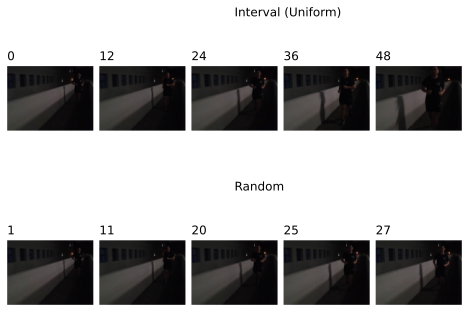

In [61]:
%%space demo:frame_sampling

import typing

n_samples = 5
d = take_one(ds['train'])

fig = plt.figure()
subfigs = fig.subfigures(nrows=2, ncols=1).flat

for fig_, suptitle_, sampler_cls_ in [
    (subfigs[0], 'Interval (Uniform)', IntervalSampling),
    (subfigs[1], 'Random', RandomSampling),
]:
    sampler_cls_: typing.Type[BaseSampling]

    fig_.suptitle(suptitle_, horizontalalignment='left')
    frame_indices = sampler_cls_(
        n_samples=n_samples,
        axis=0,
    )._sample_indices(d['frameseq'])

    axes = fig_.subplots(
        nrows=1, 
        ncols=len(frame_indices)
    )
    for ax, frame_idx in zip(
        axes.flat, 
        frame_indices,
    ):
        ax.axis('off')
        ax.imshow(d['frameseq'][frame_idx])
        ax.set_title(int(frame_idx), loc='left')

fig.show()
scrapbook.glue(
    'figure:frame_sampling', 
    fig, 
    encoder='pickle'
)
scrapbook.glue(
    'data:frame_sampling', 
    {
        'label': d['label'].numpy(), 
        'label:name': 
            ds_builder.info.features['label']
            .decode_example(
                d['label']
            )
    }
)

## Feature Extraction

... through late fusion

In [62]:
# TODO
class BatchStack(keras.layers.Layer):
    def __init__(
        self, 
        layer: keras.layers.Layer, 
        **kwargs
    ):
        super().__init__(**kwargs)
        self.layer = layer

    def call(self, inputs):
        return tf.map_fn(self.layer, inputs)

class Unragging(keras.layers.Layer):
    def call(self, inputs):
        if not isinstance(inputs, tf.RaggedTensor):
            return inputs
        return inputs.to_tensor()

In [63]:
class Flattened(keras.layers.Layer):
    def __init__(self, layer, axis, **kwargs):
        super().__init__(**kwargs),
        self.layer = layer
        self.axis = axis

    def call(self, inputs):
        axis = self.axis
        outputs = tf.reshape(
            inputs, 
            tf.concat([
                [-1],
                tf.shape(inputs)[(axis + 1):],
            ], axis=0)
        )
        outputs = self.layer(outputs)
        outputs = tf.reshape(
            outputs, 
            tf.concat([
                tf.shape(inputs)[:(axis + 1)],
                tf.shape(outputs)[1:],
            ], axis=0)
        )
        return outputs


### Model: ConvNeXt

In [64]:
def ConvNeXtFeatureExtraction(
    trainable=False,
    name='model.feature.convnext',
    **convnext_kwds
):
    model = keras.Sequential([
        Unragging(),
        keras.layers.TimeDistributed(
            # NOTE For ConvNeXt, preprocessing is included 
            # in the model using a Normalization layer. 
            # ConvNeXt models expect their inputs to be 
            # float or uint8 tensors of pixels with values in the [0-255] range.
            # NOTE ref https://keras.io/api/applications/convnext/#convnextsmall-function
            base_model := keras.applications.ConvNeXtSmall(
                include_top=False,
                weights='imagenet', 
                pooling='avg',
                **convnext_kwds,
            ),
            name=name,
        )
    ], name=name)
    base_model.trainable = trainable
    return model

### Model: MoveNet

In [65]:
import functools

class MoveNet(keras.Model):
    class _repository:
        import tensorflow_hub as tfhub
        base_url = 'https://tfhub.dev/google/movenet/singlepose'
        variant_url = {
            'lightning': rf'{base_url}/lightning/4',
            'thunder': rf'{base_url}/thunder/4',
        }

        @classmethod
        @functools.cache
        def load(cls, variant=None):
            return cls.tfhub.load(
                cls.variant_url.get(variant, 'thunder')
            )
    
    @classmethod
    def from_hub(cls, variant=None):
        return cls(
            cls._repository.load(variant)
        )

    # TODO NOTE saved_model: tensorflow saved model
    def __init__(self, saved_model, **kwargs):
        super().__init__(**kwargs)
        self.model = saved_model

    @property
    def base(self):
        return self.model.signatures['serving_default']

    # TODO NOTE input shape (1, w, h, c) or (w, h, c)
    def call(self, inputs):
        _n_batches, *input_frame_size, _n_channels = (
            self.base.inputs[0].shape
        )
        inputs = tf.image.resize_with_pad(
            inputs,
            *input_frame_size
        )
        # TODO NOTE movenet's batch processing is dysfunctional
        inputs = tf.reshape(inputs, self.base.inputs[0].shape)
        inputs = tf.cast(inputs, dtype=self.base.inputs[0].dtype)
        return self.base(inputs)['output_0']

In [66]:
def MoveNetFeatureExtraction(
    model: MoveNet | None = None,
    name='model.feature.movenet',
):
    if model is None:
        model = MoveNet.from_hub()

    return keras.Sequential([
        Unragging(),
        # ensure input is tf.float32
        keras.layers.Lambda(lambda x: tf.cast(x, tf.float32)),
        keras.layers.TimeDistributed(
            BatchStack(
                keras.Sequential([
                    model,
                    # NOTE excl. last axis (probability/confidence)
                    keras.layers.Lambda(lambda x: x[..., :-1]),
                    keras.layers.Lambda(tf.squeeze),
                ])
            )
        ),
        # TODO
        keras.layers.TimeDistributed(
            keras.layers.AveragePooling2D()
        ),
        # TODO embedding layers
    ], name=name)

#### Demo: Frame Sampling + Feature Extraction

In [67]:
%%space demo:feat_extraction

def DemoFeatureExtraction(n_frames=8):
    return (
        keras.models.Sequential([
            BatchIntervalSampling(num_samples=n_frames),
            Unragging(),
            ConvNeXtFeatureExtraction(),
        ])
    )

batch_size = 2
sample_input = take_one(ds['train'].ragged_batch(batch_size))['frameseq']

def _descr_shape(
    shape: tf.TensorShape, 
    placeholder: str
):
    return [
        n if n is not None else placeholder
        for n in shape
    ]

placeholder = '<variable>'
report = {
    'placeholder:shape': placeholder,
    'shape:input': _descr_shape(
        sample_input.shape, 
        placeholder=placeholder,
    ),
    'shape:output': _descr_shape(
        DemoFeatureExtraction()(sample_input).shape,
        placeholder=placeholder,
    ),
}

scrapbook.glue(
    'data:feat_extraction', 
    report
)
report

{'placeholder:shape': '<variable>',
 'shape:input': [2, '<variable>', '<variable>', '<variable>', 3],
 'shape:output': [2, 8, 768]}

## Classification

In [68]:
class BaseSplitter:
    def __call__(
        self, 
        builder: tfds.core.DatasetBuilder
    ) -> typing.Iterable[typing.Tuple]:
        raise NotImplementedError

class KFoldSplitter:
    def __init__(
        self, 
        subset: str,
        n_splits: int
    ):
        self.subset = subset
        self.range_perct = range(0, 100, 100 // n_splits)
    
    def __call__(self, builder: tfds.core.DatasetBuilder):
        # ref https://www.tensorflow.org/datasets/splits#cross_validation
        next_k = lambda k: min(
            k + self.range_perct.step, 
            self.range_perct.stop
        )
        splits_fold = [
            [f'{self.subset}[:{k}%]'
             f'+{self.subset}[{next_k(k)}%:]' 
                for k in self.range_perct],
            [f'{self.subset}[{k}%:{next_k(k)}%]' 
                for k in self.range_perct],
        ]
        datasets = [
            builder.as_dataset(split=split_fold)
            for split_fold in splits_fold
        ]
        return zip(*datasets)

def cross_validate(
    model: keras.Model, 
    builder: tfds.core.DatasetBuilder,
    splitter: BaseSplitter,
    batch_fn: typing.Callable[
        [tf.data.Dataset], 
        tf.data.Dataset
    ] = None,
    **fit_kwds,
):
    def _impl(
        model: keras.Model, 
        splitter: typing.Iterable[typing.Tuple],
        **fit_kwds,
    ):
        return [
            model.fit(
                ds_train,
                validation_data=ds_val,
                **fit_kwds,
            ) for ds_train, ds_val in splitter
        ]

    return _impl(
        model=model,
        splitter=(
            [
                batch_fn(ds) if batch_fn is not None else ds
                for ds in dss
            ] for dss in splitter(builder)
        ),
        **fit_kwds,
    )

### Classifier

In [69]:
def LSTMClassifier(n_classes, name=None, **seq_kwds):
    return keras.models.Sequential(
        [
            keras.layers.LSTM(64),    
            #keras.layers.Dense(64, activation='relu'),
            #keras.layers.Dropout(.5),
            keras.layers.Dense(32, activation='relu'),
            #keras.layers.Dropout(.25),
            #keras.layers.Dense(16, activation='relu'),
            keras.layers.Dense(n_classes),
        ], 
        name=(
            name if name is not None else 
            rf'model.classifier_{n_classes}_class'
        ),
        **seq_kwds
    )

### Model

`Model`: The model factory method to enable end-to-end training.

In [70]:
def Model(
    n_classes, 
    augmentations: typing.Sequence[keras.layers.Layer] = [],
    feature_extraction: typing.Callable[[], keras.layers.Layer] | None = None,
    name: str = 'model',
    compile: bool = True,
):
    if feature_extraction is None:
        feature_extraction = ConvNeXtFeatureExtraction()
    res = keras.models.Sequential([
        # NOTE frames are expected to be multi-channel 8-bit
        keras.layers.Lambda(lambda x: tf.cast(x, tf.uint8)),
        BatchIntervalSampling(num_samples=32),
        Unragging(),
        *augmentations,
        feature_extraction,
        LSTMClassifier(n_classes=n_classes),
    ], name=name)

    if compile:
        res.compile(
            optimizer=keras.optimizers.Adam(
                learning_rate=1e-3,
            ),
            loss=keras.losses.SparseCategoricalCrossentropy(
                from_logits=True,
            ),
            metrics=['accuracy'],
        )

    return res

`ModelManager`: A helper class that manages a `Model` instance to enable training and evaluation in one take.

In [71]:
class ModelManager:
    class TrainingResult:
        import matplotlib as mpl
        import matplotlib.pyplot as plt

        def __init__(
            self, 
            histories: typing.Sequence[keras.callbacks.History]
        ):
            self.histories = histories

        def plot(
            self, 
            fig: mpl.figure.Figure | None = None,
            metrics: typing.Collection[str] | None = None,
            metric_labels: typing.Mapping[str, str] | None = None,
            **subplot_kwds,
        ):
            metrics = metrics or ['loss', 'val_loss']
            if not metric_labels:
                metric_labels_base = {
                    'loss': 'Loss',
                    'accuracy': 'Accuracy',
                }
                metric_labels = {
                    **metric_labels_base,
                    **{f'val_{key}': f'{value} (Validation)'
                        for key, value in metric_labels_base.items()}
                }

            fig = fig or self.plt.gcf()
            axs = fig.subplots(
                nrows=1, ncols=len(self.histories), 
                sharex=True, sharey=True,
                **subplot_kwds,
            )

            for n, (ax, history) in enumerate(
                zip(axs.flat, self.histories)
            ):
                for metric in metrics:
                    if metric not in history.history:
                        continue
                    ax.plot(
                        history.epoch,
                        history.history[metric],
                        label=metric_labels.get(metric, None),
                    )
                ax.set_title(n, loc='left')

            fig.supxlabel('Epoch')
            fig.legend(*ax.get_legend_handles_labels())
            
            return fig
        
    class EvaluationResult(dict):
        pass

    @staticmethod
    def _fetch_batch(
        ds: tf.data.Dataset, 
        batch_size: int
    ):
        return (
            ds.ragged_batch(batch_size=batch_size)
            .map(lambda x: (x['frameseq'], x['label']))
            .prefetch(tf.data.AUTOTUNE)
        )
    
    @staticmethod
    def _infer_batch_size(ds_builder, scale: int = 2):
        return (
            ds_builder.info.features['label'].num_classes * scale
        )

    def __init__(self, model):
        self.model = model

    def train(
        self, 
        ds_builder, 
        batch_size: int | None = None,
        epochs: int | None = None,
        callbacks: typing.Sequence = [],
        **kwargs,
    ):
        return self.TrainingResult(
            cross_validate(
                self.model, 
                ds_builder, 
                splitter=KFoldSplitter(subset='train', n_splits=3), 
                batch_fn=lambda ds: self._fetch_batch(
                    ds, 
                    batch_size=batch_size if batch_size is not None 
                        else self._infer_batch_size(ds_builder),
                ),
                epochs=epochs if epochs is not None else 10,
                callbacks=[
                    keras.callbacks.EarlyStopping(
                        monitor='val_loss', patience=3,
                    ),
                    keras.callbacks.ProgbarLogger(),
                    *callbacks,
                ],
                **kwargs,
            )
        )

    def evaluate(
        self, 
        ds_builder, 
        batch_size: int | None = None,
        **kwargs,
    ):
        result = self.model.evaluate(
            self._fetch_batch(
                ds_builder.as_dataset(split='val'), 
                batch_size=batch_size if batch_size is not None
                    else self._infer_batch_size(ds_builder),
            ),
            **kwargs,
        )
        return self.EvaluationResult(
            zip(self.model.metrics_names, result)
        )

In [72]:
model = Model(
    n_classes=(
        ds_builder.info
        .features['label']
        .num_classes
    )
)
manager = ModelManager(model)

### Training

In [73]:
results_train = manager.train(ds_builder)

Epoch 1/10
9/9 [==============================] - 50s 6s/sample - loss: 1.5984 - accuracy: 0.4200 - val_loss: 1.2145 - val_accuracy: 0.7000
Epoch 2/10
9/9 [==============================] - 19s 2s/sample - loss: 1.0133 - accuracy: 0.8700 - val_loss: 0.9060 - val_accuracy: 0.7800
Epoch 3/10
9/9 [==============================] - 19s 2s/sample - loss: 0.7029 - accuracy: 0.9100 - val_loss: 0.7331 - val_accuracy: 0.8600
Epoch 4/10
9/9 [==============================] - 19s 2s/sample - loss: 0.5229 - accuracy: 0.9400 - val_loss: 0.5554 - val_accuracy: 0.8800
Epoch 5/10
9/9 [==============================] - 19s 2s/sample - loss: 0.3388 - accuracy: 0.9500 - val_loss: 0.4461 - val_accuracy: 0.9000
Epoch 6/10
9/9 [==============================] - 19s 2s/sample - loss: 0.2614 - accuracy: 0.9700 - val_loss: 0.3659 - val_accuracy: 0.9200
Epoch 7/10
9/9 [==============================] - 19s 2s/sample - loss: 0.1987 - accuracy: 0.9700 - val_loss: 0.3129 - val_accuracy: 0.9400
Epoch 8/10
9/9 [====

#### Demo: Result

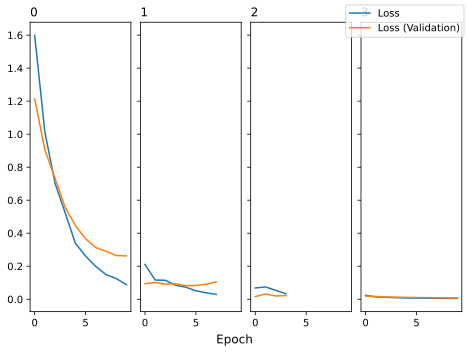

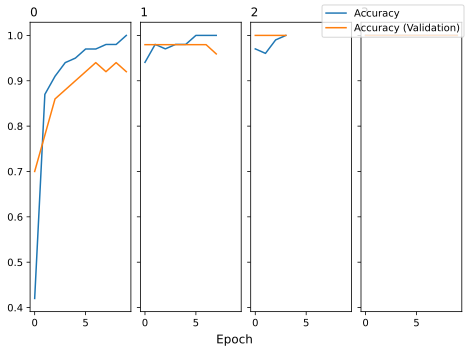

In [74]:
%%space demo:clf:train

# loss
fig_loss = results_train.plot(
    fig=plt.figure(), 
    metrics=['loss', 'val_loss'],
)
fig_loss.show()
scrapbook.glue(
    'figure:clf:train:loss', 
    fig_loss,
)

# accuracy
fig_acc = results_train.plot(
    fig=plt.figure(), 
    metrics=['accuracy', 'val_accuracy'],
)
fig_acc.show()
scrapbook.glue(
    'figure:clf:train:acc', 
    fig_acc,
)

### Evaluation

In [75]:
results_val = manager.evaluate(ds_builder)
scrapbook.glue(
    'data:clf:val', 
    results_val,
)
results_val

8/8 [==============================] - 12s 1s/step - loss: 4.0273 - accuracy: 0.1458


{'loss': 4.02734375, 'accuracy': 0.1458333283662796}

## Classification with Augmentations

### Augmentations (Enhancements)

Histogram Equalization

In [76]:
import keras_cv

def Augmentation():
    return keras.layers.TimeDistributed(
        keras_cv.layers.Equalization((0., 255.))
    )

#### Demo: Equalization: Before, After

In [77]:
%%space demo:clf_augment:augment:histeq

class ImageHistViz:
    import numpy as np
    import matplotlib.pyplot as plt
    
    def __init__(self, im, cspace=None, ax=None):
        self.im = im
        self.cspace = cspace
        self.ax = ax or self.plt.gca()

    def plot(
        self, 
        bins=256, 
        cumulative=False, 
        labels=None, colors=None
    ):
        cspace_info = {
            'rgb': {'labels': 'RGB', 'colors': 'rgb'}
        }
        
        shape_of = self.np.shape
        reshape = self.np.reshape

        for channel, color, label in zip(
            range(shape_of(self.im)[-1]), 
            colors or cspace_info[self.cspace]['colors'], 
            labels or cspace_info[self.cspace]['labels'],
        ):
            self.ax.hist(
                reshape(self.im[..., channel], (-1, )), 
                bins=bins, 
                cumulative=cumulative,
                histtype='step' if cumulative else 'stepfilled',
                color=color, 
                alpha=1. / shape_of(self.im)[-1], 
                label=label or channel,
            )
            self.ax.ticklabel_format(
                axis='y', 
                style='scientific', 
                scilimits=(0, 0),
            )

        return self
        
    def xylabel(self):
        self.ax.set(
            xlabel='Intensity',
            ylabel='Count',
        )
        return self

    def legend(self, *args, **kwargs):
        self.ax.legend(*args, **kwargs)
        return self

In [78]:
%%space demo:clf_augment:augment:histeq

class ImageHistVizGallery:
    import matplotlib.pyplot as plt

    @classmethod
    def stacked(cls, im, fig=None, subplot_kwds=dict(), **kwargs):
        fig = fig or cls.plt.gcf()
        return cls(
            im,
            axes=fig.subplots(
                nrows=2, ncols=1, 
                sharex=True, sharey=False,
                **subplot_kwds,
            ).flat,
            **kwargs,
        )
    
    def __init__(self, im, axes, **histviz_kwds):
        self.im = im
        self.viz_hist = {
            key: ImageHistViz(im, ax=ax, **histviz_kwds)
            for key, ax in zip(['noncum', 'cum'], axes)
        }

    def plot(self):        
        self.viz_hist['noncum'].plot(cumulative=False)
        self.viz_hist['cum'].plot(cumulative=True)        
        return self

    def xylabel(self):
        for viz in self.viz_hist.values():
            viz.xylabel()
        return self

    def legend(self, *args, **kwargs):
        for viz in self.viz_hist.values():
            viz.legend(*args, **kwargs)
        return self

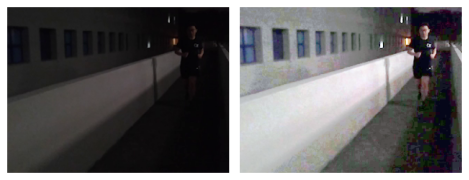

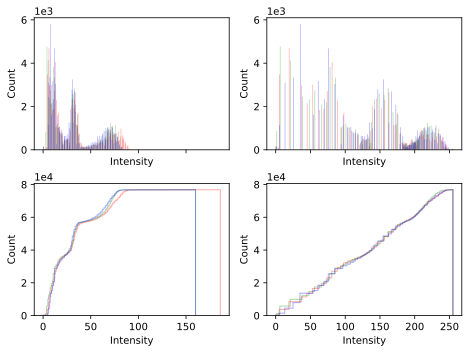

In [79]:
%%space demo:clf_augment:augment:histeq

imageseq = take_one(ds['train'])['frameseq']
def _imageseq_plot_before_after(fig=None):
    if fig is None:
        fig = plt.gca()
    
    subfigs = fig.subfigures(nrows=1, ncols=2)
    for (im, title), subfig in zip(
        [
            (imageseq[0].numpy(), 'Before'), 
            (Augmentation()(imageseq)[0].numpy().astype(int), 'After')
        ],
        subfigs.flat,
    ):
        yield (im, title), subfig

# images
fig_im = plt.figure()
for (im, title), subfig in _imageseq_plot_before_after(fig_im):
    ax = subfig.subplots()
    ax.axis('off')
    ax.imshow(im)
fig_im.show()
scrapbook.glue(
    'figure:clf_augment:augment:histeq:im', 
    fig_im, 
    encoder='pickle'
)

# image histograms
fig_imhist = plt.figure()
for (im, title), subfig in _imageseq_plot_before_after(fig_imhist):
    (
        ImageHistVizGallery.stacked(
            im, cspace='rgb', 
            fig=subfig,
        )
        .plot()
        .xylabel()
    )
fig_imhist.show()
scrapbook.glue(
    'figure:clf_augment:augment:histeq:imhist', 
    fig_imhist, 
    encoder='pickle'
)

### Model

In [80]:
model_w_aug = Model(
    n_classes=(
        ds_builder.info
        .features['label']
        .num_classes
    ),
    augmentations=[Augmentation()],
)
manager_w_aug = ModelManager(model_w_aug)

### Training

In [81]:
results_train_w_aug = manager_w_aug.train(ds_builder)

Epoch 1/10
9/9 [==============================] - 53s 6s/sample - loss: 1.7193 - accuracy: 0.3900 - val_loss: 1.3075 - val_accuracy: 0.7400
Epoch 2/10
9/9 [==============================] - 20s 2s/sample - loss: 1.0809 - accuracy: 0.8400 - val_loss: 0.9074 - val_accuracy: 0.8600
Epoch 3/10
9/9 [==============================] - 20s 2s/sample - loss: 0.6959 - accuracy: 0.9100 - val_loss: 0.6617 - val_accuracy: 0.8400
Epoch 4/10
9/9 [==============================] - 20s 2s/sample - loss: 0.4646 - accuracy: 0.9200 - val_loss: 0.5124 - val_accuracy: 0.8800
Epoch 5/10
9/9 [==============================] - 20s 2s/sample - loss: 0.3211 - accuracy: 0.9600 - val_loss: 0.4792 - val_accuracy: 0.9000
Epoch 6/10
9/9 [==============================] - 20s 2s/sample - loss: 0.2314 - accuracy: 0.9700 - val_loss: 0.4004 - val_accuracy: 0.9000
Epoch 7/10
9/9 [==============================] - 20s 2s/sample - loss: 0.1596 - accuracy: 0.9800 - val_loss: 0.3486 - val_accuracy: 0.9000
Epoch 8/10
9/9 [====

#### Demo: Result

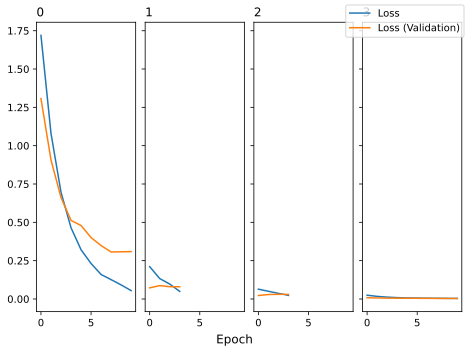

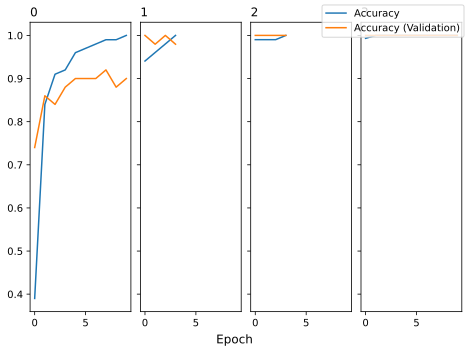

In [82]:
%%space demo:clf_augment:train

# loss
fig_loss = results_train_w_aug.plot(
    fig=plt.figure(), 
    metrics=['loss', 'val_loss'],
)
fig_loss.show()
scrapbook.glue(
    'figure:clf_augment:train:loss', 
    fig_loss,
)

# accuracy
fig_acc = results_train_w_aug.plot(
    fig=plt.figure(), 
    metrics=['accuracy', 'val_accuracy'],
)
fig_acc.show()
scrapbook.glue(
    'figure:clf_augment:train:acc', 
    fig_acc,
)

### Evaluation

In [83]:
results_val_w_aug = manager_w_aug.evaluate(ds_builder)
scrapbook.glue(
    'data:clf_augment:val', 
    results_val_w_aug,
)
results_val_w_aug

8/8 [==============================] - 13s 2s/step - loss: 3.5059 - accuracy: 0.1042


{'loss': 3.505859375, 'accuracy': 0.1041666641831398}

### Demo: Final Model

In [84]:
model_w_aug.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_5 (Lambda)           (None, None, None, None   0         
                             , 3)                                
                                                                 
 batch_interval_sampling_7   (None, None, None, None   0         
 (BatchIntervalSampling)     , 3)                                
                                                                 
 unragging_15 (Unragging)    (None, None, None, None   0         
                             , 3)                                
                                                                 
 time_distributed_2 (TimeDi  (None, None, None, None   0         
 stributed)                  , 3)                                
                                                                 
 model.feature.convnext (Se  (None, None, 768)         494546

In [85]:
dotfig_model_w_aug = keras.utils.model_to_dot(
    model_w_aug,
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=True,
    layer_range=None,
    show_layer_activations=True,
    show_trainable=True
)

ipy.core.display.SVG(dotfig_model_w_aug.create_svg())
scrapbook.glue(
    'data:clf_augment:dotfig_model', 
    dotfig_model_w_aug,
    encoder='pickle'
)